# <u>Problem Statement</u>
Analyse the dataset and select the appropriate features for customer segmentation to help the business market its top two selling products: 'Life Insurance' and 'Career Break Insurance'

## Objective 
To draw important business insights and select the right features to be used for segmentation

## Data Dictionary
The dataset consists of the following features:
1. `first_name` - First Name of the customer

2. `lat_name` - Last Name of the customer

3. `title` - Prefix of Customer Name

4. `gender` - Customer's gender

5. `email` - Email of the customer

6. `city` - City of residence

7. `country` - Country of residence

8. `country_code` - Country Code of Residence

9. `latitude` - Location parameter (from east to west)

10. `longitude` - Location Parameter (from north to south)

11. `phone` - Customer's contact number

12. `street_address` - Customer contact address

13. `street_name` - Street Name

14. `street_number` - Street Number

15. `street_suffix` - Street suffix

16. `time_zone` - Time Zone

17. `company_name` - Name of Customer's Employee

18. `department` - Department

19. `job_title` - Job Role of the customer

20. `language` - Customer's Language

21. `university` - Customer's University

22. `linkedin_skill` - Skills of the Customer

23. `ip_address` - Customer's Device IP Address

## <u>Steps Performed</u>
In this notebook, we will analyze the data and try to achieve our objective step by step:
   - Load the dataset
   - Get a high level understanding of the datset
   - Exploratory data analysis
   - Feature Engineering
   - Clustering
   - Summary
   - Next steps

In [1]:
# import the libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
import warnings
warnings.simplefilter('ignore')

%matplotlib inline

In [2]:
df = pd.read_csv('Customer Segmentation.csv')
df.head(3)

,first_name,last_name,title,gender,email,city,country,country_code,latitude,longitude,...,street_number,street_suffix,time_zone,company_name,department,job_title,language,university,linkedin_skill,ip_address
0,Priscella,Pollett,Honorable,Agender,ppollett0@foxnews.com,Sesheke,Zambia,ZM,-17.473886,24.295514,...,90004,Crossing,Africa/Lusaka,Omba,Support,Internal Auditor,Indonesian,University of Zambia,Lifestyle,129.60.144.253
1,Ana,Onge,Mr,Male,aonge1@fda.gov,Querecotillo,Peru,PE,-4.838304,-80.648215,...,9,Center,America/Lima,Cogidoo,Sales,Compensation Analyst,Fijian,Universidad Nacional de San Antonio Abad,Healthcare Industry,100.2.67.41
2,Butch,Rawls,Mrs,Male,brawls2@slideshare.net,Licupis,Peru,PE,-6.424052,-79.242648,...,5104,Point,America/Lima,Edgewire,Support,Health Coach II,Gujarati,Universidad Nacional de San Martín,Visual SVN,48.161.197.47


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51000 entries, 0 to 50999
Data columns (total 23 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   first_name      51000 non-null  object 
 1   last_name       51000 non-null  object 
 2   title           51000 non-null  object 
 3   gender          51000 non-null  object 
 4   email           51000 non-null  object 
 5   city            51000 non-null  object 
 6   country         51000 non-null  object 
 7   country_code    50966 non-null  object 
 8   latitude        51000 non-null  float64
 9   longitude       51000 non-null  float64
 10  phone           51000 non-null  object 
 11  street_address  51000 non-null  object 
 12  street_name     51000 non-null  object 
 13  street_number   51000 non-null  int64  
 14  street_suffix   51000 non-null  object 
 15  time_zone       51000 non-null  object 
 16  company_name    51000 non-null  object 
 17  department      51000 non-null 

In [4]:
df.describe()

,latitude,longitude,street_number
count,51000.000000,51000.000000,51000.000000
mean,24.785394,44.021854,11071.446275
std,24.522517,70.311057,23366.976562
min,-54.807950,-178.165510,0.000000
25%,7.590523,3.367186,21.000000
50%,30.826141,38.101695,439.000000
75%,44.303742,111.877499,6760.250000
max,78.221061,179.350460,99997.000000


***From the above it is clear that:***
- There are no missing values in the dataset of 51k records. 
- There are a total of 23 features out of which only 3 are numerical and the rest are categorical features. 
- The memory consumption is quite high at around 9 MB. We can reduce this by changing the datatypes of the features from 'object' to 'category'.

## 1.<u>EDA</u>

In this section we will get a deeper understanding of each feature in the dataset. We will answer the following:

1. Do we have duplicates?
2. Seggregating features into categorical and numerical
3. Univariate Analysis (number and distribution of unique groups within each categorical variables)
4. Demographic Feature Analysis
    - Distribution of number of customers based on title, gender and department
    - Identifying top 20 universities, companies and profession
    - Further analysing customers of top two profession
    - Most common skill among the customers
5. Geographic Feature Analysis
    - Extracting new feature from time_zone
    - Identifying the top 20 countries from where the majority of the customers belong
    - Visualizing the distribution of customer count across the globe
    - Identify the latitude and longitude ranges for each continent
    - Finding which continents (and also the countries within each continent) dominate the customer population

In [5]:
# checking duplicate entries
duplicates = df[df.duplicated()]
duplicates

,first_name,last_name,title,gender,email,city,country,country_code,latitude,longitude,...,street_number,street_suffix,time_zone,company_name,department,job_title,language,university,linkedin_skill,ip_address


**We do not have any duplicate records in the dataset**

In [6]:
# seggregating into lists of categorical and numercial features
cat_features = [i for i in df.columns if df[i].dtypes == 'object']
num_features = [i for i in df.columns if i not in cat_features]
print(cat_features, '\n', num_features)

['first_name', 'last_name', 'title', 'gender', 'email', 'city', 'country', 'country_code', 'phone', 'street_address', 'street_name', 'street_suffix', 'time_zone', 'company_name', 'department', 'job_title', 'language', 'university', 'linkedin_skill', 'ip_address'] 
 ['latitude', 'longitude', 'street_number']


In [7]:
# Groups within each categorical feature
for i in cat_features:
    print(i)
    print(df[i].unique(), '\n') if df[i].nunique() < 15 else print(df[i].nunique(), '\n')

first_name
8416 

last_name
31257 

title
['Honorable' 'Mr' 'Mrs' 'Rev' 'Dr' 'Ms'] 

gender
['Agender' 'Male' 'Female' 'Non-binary' 'Polygender' 'Genderqueer'
 'Genderfluid' 'Bigender'] 

email
51000 

city
24921 

country
235 

country_code
234 

phone
50999 

street_address
50463 

street_name
500 

street_suffix
21 

time_zone
330 

company_name
383 

department
['Support' 'Sales' 'Engineering' 'Marketing' 'Human Resources'
 'Accounting' 'Services' 'Business Development' 'Product Management'
 'Legal' 'Research and Development' 'Training'] 

job_title
195 

language
97 

university
6633 

linkedin_skill
5976 

ip_address
51000 



**We need to get rid of unnecessary and redundant features. Unique idedntifiers do not add any information about the customers, so we will drop the features having almost all unique values.**

**Also, similar features which convey the same information should be avoided. In this dataset, country and country_code essentially convey the same information. So we will drop features having lesser unique values to prevent losing any information.**

**Moreover, it doesn't make any sense to cluster customers based on the names**

In [8]:
# Dropping features which have all unique values
del_features = ['email', 'phone', 'ip_address', 'street_address', 'country_code', 'first_name', 'last_name']
df.drop(del_features, axis=1, inplace=True)

In [9]:
df.columns

Index(['title', 'gender', 'city', 'country', 'latitude', 'longitude',
       'street_name', 'street_number', 'street_suffix', 'time_zone',
       'company_name', 'department', 'job_title', 'language', 'university',
       'linkedin_skill'],
      dtype='object')

**We are now left with 2 types of features, Geographic and Demographic**
1. Geographic Features - city, country, latitude, longitude, street_name, street_number, street_suffix, time_zone
2. Demographic Features - title, gender, company_name, department, job_title, language, university, linkedin_skill

## Demographic Features Analysis

In [10]:
# Renaming the columns
df.rename(columns={'company_name': 'company', 'job_title': 'job', 'linkedin_skill': 'skill'}, inplace=True)

In [11]:
def groups(feature, col):
    '''grouping by each feature and counting number of occurances of each values'''
    groups = df.groupby(feature).size().reset_index().rename(columns={0: 'Total'}).sort_values('Total', ascending=False)
    fig = px.pie(groups, values='Total', names=feature, color_discrete_sequence=col, title='Distribution of {}'.format(feature))
    fig.show()

In [12]:
to_get_groups = {'title': px.colors.sequential.RdBu, 
                 'gender': px.colors.sequential.RdBu_r, 
                 'department': px.colors.sequential.BuGn_r}

for i, j in to_get_groups.items():
    groups(i, j)

***The title and department features are equally distributed whereas males and females dominate the gender feature. There are equal number of male and female customers in the dataset***

In [13]:
companies = df[['company', 'gender']].groupby(['company', 'gender']).size().reset_index().sort_values(by=0, ascending=False).rename(columns={0: 'count'}).head(20)
px.bar(companies, x = 'company', y = 'count', title = 'Top 20 Companies', color='gender', barmode='group')

In [14]:
universities = df[['university', 'gender']].groupby(['university', 'gender']).size().reset_index().sort_values(by=0, ascending=False).rename(columns={0: 'count'}).head(20)
px.bar(universities, x = 'university', y = 'count', title = 'Top 20 Universities', color='gender', barmode='group')

In [15]:
jobs = df[['job', 'gender']].groupby(['job', 'gender']).size().reset_index().sort_values(by=0, ascending=False).rename(columns={0: 'count'}).head(20)
px.bar(jobs, x = 'job', y = 'count', title = 'Top 20 Professions', color='gender', barmode='group')

***From the above plots we analyse how the males and females are distributed among different features. We analyze only the top 20 companies, professions and universities. Key findings:***
1. `Youspan` is the company where most of the customers work. There are a couple of companies where only male customers work whereas there are some where only females are working.
2. The top university where most of the customers studied/studies is the `Pyongyang University of Science & Technology`. For the other top universities only either male customers had attended or female customers but not both.
3. `Junior Executive` and `Analyst Programmer` are the dominating professions. Other top professions are either meant only for female or male customers.

### Analysing the customers of top prefessions

In [16]:
# looking at the top professions
df_top_prof = df[(df['job'] == 'Junior Executive') | (df['job'] == 'Analyst Programmer')]
df_top_prof.head(3)

,title,gender,city,country,latitude,longitude,street_name,street_number,street_suffix,time_zone,company,department,job,language,university,skill
12,Dr,Female,Rundeng,Indonesia,2.692835,97.850395,Glacier Hill,4,Center,Asia/Jakarta,Vipe,Marketing,Junior Executive,Hiri Motu,Universitas Terbuka Indonesia,DGA
20,Dr,Male,Nanying,China,37.953529,114.816881,Dapin,13068,Trail,Asia/Chongqing,Eamia,Support,Junior Executive,Swahili,The University of Nottingham Ningbo China,BLS
24,Dr,Female,Youngstown,United States,41.069925,-80.693718,Elgar,4,Pass,America/New_York,Meejo,Research and Development,Analyst Programmer,Bislama,University of Nebraska - Lincoln,Smartboard


In [17]:
df_top_prof.shape[0]

999

In [18]:
df_filter = df_top_prof.groupby(['country', 'gender', 'job']).size().reset_index().rename(columns={0: 'count'}).sort_values(by='count', ascending=False)
df_filter

,country,gender,job,count
60,China,Male,Analyst Programmer,46
61,China,Male,Junior Executive,42
57,China,Female,Analyst Programmer,42
58,China,Female,Junior Executive,40
131,Indonesia,Female,Analyst Programmer,20
...,...,...,...,...
152,Italy,Female,Analyst Programmer,1
153,Ivory Coast,Male,Analyst Programmer,1
154,Jamaica,Female,Analyst Programmer,1
155,Jamaica,Female,Junior Executive,1


In [19]:
px.scatter(df_filter, x='country', y='gender', color='job', size='count')

Customers working as Junior Executive and Analyst Programmer are majorly from China or Indonesia. From the above plot we can find the place of residence of these professionals. For example, there are a couple of genderqueer and polygender customers from Malasiya, South Korea, Cuba and Barbados who work as Analyst Programmer. 

In [20]:
from wordcloud import WordCloud, STOPWORDS
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
import gensim
from nltk.corpus import stopwords

In [21]:
stop_words = stopwords.words('english')
stop_words.extend(['Name', 'dtype', 'skill', 'object', 'Length'])

In [22]:
# Remove stop words and remove words with 2 or less characters
def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text) :
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 2 and token not in stop_words:
            result.append(token)
            
    return ' '.join(result)

In [23]:
df['skill'] = df['skill'].apply(preprocess)

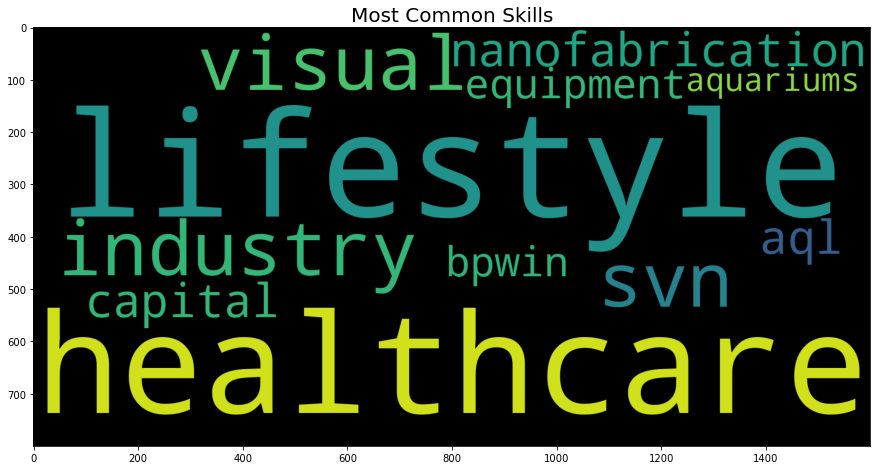

In [24]:
plt.figure(figsize=(15,10))
wc = WordCloud(width=1600, height=800, stopwords=stop_words).generate(str(df.skill))
plt.title('Most Common Skills', fontsize=20)
plt.imshow(wc)

***Most common skills among the customers are healthcare and lifestyle***

## Geographic Feature Analysis

In [25]:
# slicing time_zone to get continent
df['continent'] = df['time_zone'].apply(lambda x: x.split('/')[0])
df.drop('time_zone', axis=1, inplace=True)
df['continent'].value_counts()

Asia         24168
Europe       14310
America       8634
Africa        3197
Indian         313
Pacific        276
Atlantic        57
Australia       44
Arctic           1
Name: continent, dtype: int64

In [26]:
countries = df[['country']].groupby('country').size().reset_index().sort_values(by=0, ascending=False).rename(columns={0: 'count'})
px.bar(countries.head(20), x = 'country', y = 'count', title = 'Top 20 Countries')

***Above are the top 20 countries in terms of number of customers. China dominates, followed by Indonesia and Russia***

In [27]:
fig = px.choropleth(countries, locations='country', locationmode= 'country names', color='count', title='Customer Count across the Globe')
fig.show()

***The above graph clearly displays the distribution of customers across the globe. Most of the customers are from China as already seen in the previous plot. The blue area denotes very less number of customers are from that place, like Australia, Inida, Africa, Greenland***

In [28]:
fig = px.scatter(df,x='latitude',y='longitude', color='continent')
fig.show()

***This shows the latitude and longitude wise continents***

All of America is has negative longitude whereas it is spread over a wided range of latitude. similary, most of the countries in Europe falls in a range of 40-60 in latitude and 0-100 in longitude

In [29]:
continent = df[['continent', 'country']].groupby(['continent', 'country']).size().reset_index().rename(columns={0:'count'}).sort_values(by='count', ascending=False)

In [30]:
px.sunburst(continent, path=['continent', 'country'], title='Distribution of Geographic Locations', values='count')

***The above interactive sunburst tells us the continent and country wise total count of customers. Asia has the highest number of customers. Within Asia, China and Indonesia dominates as we saw in the bar chart earlier. Europe and America are the next top contributors.***

## 2. <u>Feature Engineering</u>
This section is all about cleaning and making the data ready for modeling. We will perform the following steps:
1. Encoding - Changing the categorical values to numerical.
2. Feature Scaling
3. Feature Selection

## Approach
Customers can be segmented based on different features. Below are the various types of possible segmentations depending on the choice of features:

|SEGMENTATION MODEL	| HOW TO SEGMENT CUSTOMERS|
| :-------:| :-----:|
|**Demographic Segmentation**|	Age, gender, income, education, and marital status
|**Geographic Segmentation** |	Country, state, city, and town
|**Psychographic Segmentation** |	Personality, attitude, values, and interests
|**Technographic Segmentation** |	Mobile-use, desktop-use, apps, and software
|**Behavioral Segmentation** |	Tendencies and frequent actions, feature or product use, and habits
|**Needs-Based Segmentation** |	Product/ service must-haves and needs of specific customer groups
|**Value-Based Segmentation** |	Economic value of specific customer groups on the business

For our dataset we have demographic and geographic features only. There is no information on customers' purchase history or behavioural details.

**To achieve Geographic Segmentation, we will now consider the geographic features for modeling and categorizing customers**

In [31]:
from sklearn.preprocessing import MinMaxScaler

In [32]:
df_geo = df.drop(['title', 'gender', 'company', 'department', 'job', 'language', 'university', 'skill'], axis=1)

In [33]:
df_geo.columns

Index(['city', 'country', 'latitude', 'longitude', 'street_name',
       'street_number', 'street_suffix', 'continent'],
      dtype='object')

In [34]:
df_geo.head()

,city,country,latitude,longitude,street_name,street_number,street_suffix,continent
0,Sesheke,Zambia,-17.473886,24.295514,Green,90004,Crossing,Africa
1,Querecotillo,Peru,-4.838304,-80.648215,Gerald,9,Center,America
2,Licupis,Peru,-6.424052,-79.242648,Eggendart,5104,Point,America
3,Yonghe,China,36.759507,110.632006,Annamark,8,Center,Asia
4,Wang Yang,Thailand,17.074088,104.449040,Clarendon,994,Trail,Asia


In [35]:
def encode(data, features):
    for i in features:
        enc_nom_1 = (data.groupby(i).size())
        data[i] = data[i].apply(lambda x : enc_nom_1[x])

In [36]:
encode(df_geo, ['city', 'country', 'street_name', 'street_suffix', 'continent'])

In [37]:
df_geo.head()

,city,country,latitude,longitude,street_name,street_number,street_suffix,continent
0,4,53,-17.473886,24.295514,99,90004,2386,3197
1,2,761,-4.838304,-80.648215,104,9,2444,8634
2,4,761,-6.424052,-79.242648,101,5104,2392,8634
3,9,9343,36.759507,110.632006,101,8,2444,24168
4,1,727,17.074088,104.449040,73,994,2393,24168


In [38]:
mn = MinMaxScaler()
df_geo = mn.fit_transform(df_geo)
df_geo = pd.DataFrame(df_geo, columns=['city', 'country', 'latitude', 'longitude', 'street_name', 'street_number', 'street_suffix', 'continent'])

In [39]:
df_geo.head()

,city,country,latitude,longitude,street_name,street_number,street_suffix,continent
0,0.030303,0.005566,0.280646,0.566299,0.482759,0.900067,0.316092,0.132246
1,0.010101,0.081353,0.375630,0.272763,0.568966,0.000090,0.649425,0.357223
2,0.030303,0.081353,0.363709,0.276695,0.517241,0.051042,0.350575,0.357223
3,0.080808,1.000000,0.688327,0.807789,0.517241,0.000080,0.649425,1.000000
4,0.000000,0.077714,0.540349,0.790495,0.034483,0.009940,0.356322,1.000000


### Summarizing

In the previous section we encoded the categorical variables and also scaled the feature values. Feature scaling means bringing down different features' values within a certain range. This step is of utmost importance in distance based algorithms like K-means, whereas this step can be skipped for tree based algorithms.

We have used MinMax scaler to scale the values within the range of (0, 1). Another option is Standard Scaler which would have scaled the data in the range of (-1, 1)

For encoding, frequency encoder method has been used. Each of the groups within a feature has been replaced with the number of its occurances within that feature. 

## 3. <u>Modeling</u>
In k-means clustering it is important to select the right number of clusters. To help us select the optimal number of clusters we will use the elbow method. 
<p>
    
For each and every cluster number the `Within Cluster Sum of Squares` is calculated and plotted in a graph. The graph forms a shape of an elbow, meaning, after a certain number of clusters the WCSS value decreases marginally. The cluster number at the elbow point is considered to be the optimal selection. Thogh, it is recommended to try one or two other values near to the elbow value and visualize the clusters.

In [40]:
from sklearn.cluster import KMeans
from bubbly.bubbly import bubbleplot
import plotly.graph_objects as go
from plotly.offline import iplot

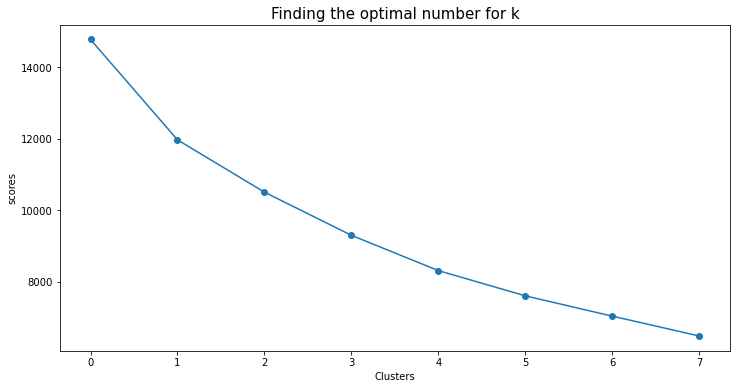

In [41]:
scores = []
for i in range(2,10):
    kmeans = KMeans(n_clusters = i)
    kmeans.fit(df_geo)
    scores.append(kmeans.inertia_)

plt.figure(figsize=(12,6))
plt.plot(scores, marker='o')
plt.title('Finding the optimal number for k', fontsize=15)
# plt.xticks(np.arange(2,10))
plt.xlabel('Clusters')
plt.ylabel('scores')
plt.show()

In [42]:
# Considering k=3
k = 3
kmeans = KMeans(k)
kmeans.fit(df_geo)

KMeans(n_clusters=3)

In [43]:
labels = kmeans.labels_
labels

array([1, 1, 1, ..., 1, 0, 0])

In [44]:
kmeans.cluster_centers_                 # coordinates of the centroids

array([[0.02035917, 0.84359696, 0.54723203, 0.8084564 , 0.54828057,
        0.11077148, 0.56566038, 1.        ],
       [0.02928914, 0.0734863 , 0.43713713, 0.38013699, 0.54943501,
        0.10839002, 0.56462663, 0.28093491],
       [0.03510283, 0.13813647, 0.71458823, 0.63342255, 0.55003924,
        0.11190991, 0.56690966, 0.75505089]])

In [45]:
cluster_centers = pd.DataFrame(data = kmeans.cluster_centers_, columns=[df_geo.columns])
cluster_centers

,city,country,latitude,longitude,street_name,street_number,street_suffix,continent
0,0.020359,0.843597,0.547232,0.808456,0.548281,0.110771,0.565660,1.000000
1,0.029289,0.073486,0.437137,0.380137,0.549435,0.108390,0.564627,0.280935
2,0.035103,0.138136,0.714588,0.633423,0.550039,0.111910,0.566910,0.755051


In [46]:
cluster_centers = mn.inverse_transform(cluster_centers)
cluster_centers = pd.DataFrame(data = cluster_centers, columns=[df_geo.columns])

In [47]:
y_means = kmeans.fit_predict(df_geo)
y_means

array([0, 0, 0, ..., 0, 1, 1])

In [48]:
for i in range(k):
    print('Cluster No. {} has {} users'.format((i), list(y_means).count(i)))

Cluster No. 0 has 12533 users
Cluster No. 1 has 14655 users
Cluster No. 2 has 23812 users


In [49]:
df_cluster = pd.concat([df, pd.DataFrame({'cluster': y_means})], axis=1)
df_cluster.head(3)

,title,gender,city,country,latitude,longitude,street_name,street_number,street_suffix,company,department,job,language,university,skill,continent,cluster
0,Honorable,Agender,Sesheke,Zambia,-17.473886,24.295514,Green,90004,Crossing,Omba,Support,Internal Auditor,Indonesian,University of Zambia,lifestyle,Africa,0
1,Mr,Male,Querecotillo,Peru,-4.838304,-80.648215,Gerald,9,Center,Cogidoo,Sales,Compensation Analyst,Fijian,Universidad Nacional de San Antonio Abad,healthcare industry,America,0
2,Mrs,Male,Licupis,Peru,-6.424052,-79.242648,Eggendart,5104,Point,Edgewire,Support,Health Coach II,Gujarati,Universidad Nacional de San Martín,visual svn,America,0


In [50]:
clusters = pd.DataFrame(df_cluster.cluster.value_counts())

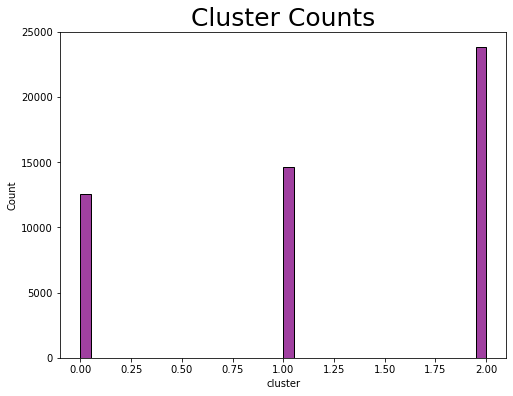

In [51]:
fig = plt.figure(figsize=(8,6))
fig = sns.histplot(df_cluster, x='cluster', color='purple')
plt.title('Cluster Counts', fontsize=25)
plt.show()

In [52]:
fig = px.scatter(df_cluster, x='latitude', y='longitude', color='cluster', hover_name='continent')
fig.update_layout(title_text='Cluster Behaviour')
fig.show()

**Most of the American, Pacific, Australian and African customers have been categorized in cluster 0. Most of the Europeans have been grouped in the 2nd cluster. No clear distinction is seen in the Asian customers. A small chunk of the Asian population has been categorized in cluster 1 and the rest in cluster 2.**

In [53]:
figure = bubbleplot(dataset=df_cluster, x_column='latitude', y_column='longitude', z_column='street_number', bubble_column='continent',  
    color_column='cluster', x_title="Latitude", y_title="Longitude", z_title="Street Number", title='Customers Cluster',
    colorbar_title='Cluster', marker_opacity=1, colorscale='Portland', scale_bubble=0.8, height=650)

iplot(figure, config={'scrollzoom': True})

**If we see the top-view of the above 3D visualization (which might change on different notebook runs), we can conclude that cluster 0 is clearly separable from the other 2 clusters. But cluster 1 and cluster 2 are not easily separable from one another based on the 3 features considered. Even from the previous plot, it was concluded that Asians have been classified into both clusters.**

## 4. <u>Summary</u>

### Data quality
1. The Data was quite clean (without any missing values), only that it has a lot of categorical features which had to be handled before modeling.
2. According to the problem statement which intended to market top selling products, it was essential to have previous purchase history of the customers. Past behavior could have helped us in clustering the customers based on their liking or need which would have been more appropriate and accurate in this case.

### Solution
1. In this problem, Geographical Clustering was chosen based on the available features. Features like country, street_number, latitude and longitude have been used to categorize customers.



2. Key Points from Analysis:
    - We see equal distribution of groups within title and department features.
    - The dataset predominantly has Asian customers. China and Indonesia are the top Asian countries.
    - Most of the customers are either Junior Executive or Analyst Programmer.
    - In some of the companies, universities and professions we find either males or females but not both. 
    - Lifestyle, healthcare and visual industry are the most common skills among the customers.
    - Continents were categorized and the corresponding latitude and longitude ranges were identified.



3. Conclusion:
***The business can focus on marketing its products based on geographic features. It can focus on the Asian market, particularly China and Indonesia, this would increase its target audience hence, increasing the chances of sales.***

## <u>Next Steps</u>

   - [ ] Try demographic segmentation using features like gender, skill, company, university.
   - [ ] We can also use Silhouette score to evaluate the quality of clusters.
   - [ ] Experiment with 2-3 other k values. Perhaps, trying with k=5 will yield better separable clusters.
   - [ ] Check for outliers. Distance based algorithms are sensitive to outliers. The performance can be improved by handling the outliers if any.